<a href="https://colab.research.google.com/github/menaenahoro/STUTERN_assignments/blob/main/Create_Psychedelic_AI_Generated_Videos_With_VQGAN_%2B_CLIP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Create Psychedelic AI-Generated Videos With VQGAN + CLIP

by [Max Woolf](https://minimaxir.com). _Last Updated: Aug 25th 2021_

This notebook allows you to create psychedelic AI generated images with as few clicks as possible for free! No coding or machine learning knowledge required!

This notebook is a more advanced variant of [my previous VQGAN + CLIP notebook](https://colab.research.google.com/drive/1wkF67ThUz37T2_oPIuSwuO4e_-0vjaLs?usp=sharing), and assumes you have some familiarity with how to use VQGAN + CLIP (you can also [read my tutorial](https://minimaxir.com/2021/08/vqgan-clip/) on how to use VQGAN + CLIP)

**PHOTOSENSITIVITY WARNING: Due to how AI generated videos work, there may be a lot of flickering the final result, particularly when using extreme per-frame transformation values. Use caution when working with them.**

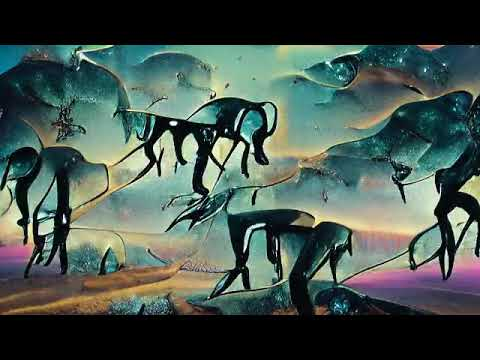

In [ ]:
#@title AI Generated Video Example

from IPython.display import YouTubeVideo
YouTubeVideo('iqMe-S79PMM', width=640, height=360)

To get started:

1. Copy this notebook to your Google Drive to keep it and save your changes. (File -> Save a Copy in Drive)
2. Run the cells below by clicking the **Play** button on the left of the cell (also visible when mousing-over the cell)

## Setup

In [ ]:
#@title Check GPU
#@markdown Run this cell to see what GPU the Colab Notebook is running. Ideally, it's not a K80 which is the slowest one.

!nvidia-smi

Thu Aug 26 03:15:20 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.57.02    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#@title Download Models and Install/Load Packages (may take a few minutes)

!git clone https://github.com/openai/CLIP
!git clone https://github.com/CompVis/taming-transformers.git
!git clone https://github.com/minimaxir/icon-image.git
!pip install Pillow numpy fire icon_font_to_png
!pip install ftfy regex tqdm omegaconf pytorch-lightning
!pip install kornia
!pip install imageio-ffmpeg   
!pip install einops
!pip install gradio          
!mkdir steps

print("Downloading ImageNet 16384")

!curl -L -o vqgan_imagenet_f16_16384.ckpt -C - 'https://heibox.uni-heidelberg.de/f/867b05fc8c4841768640/?dl=1'
!curl -L -o vqgan_imagenet_f16_16384.yaml -C - 'https://heibox.uni-heidelberg.de/f/274fb24ed38341bfa753/?dl=1'

import argparse
import math
from pathlib import Path
import sys

sys.path.insert(1, '/content/taming-transformers')
sys.path.insert(1, '/content/icon-image')

from icon_image import gen_icon
from IPython import display
from base64 import b64encode
from omegaconf import OmegaConf
from PIL import Image, ImageChops
from PIL.PngImagePlugin import PngInfo
from taming.models import cond_transformer, vqgan
import taming.modules 
import torch
from torch import nn, optim
from torch.nn import functional as F
from torchvision import transforms
from torchvision.transforms import functional as TF
from torch.optim.lr_scheduler import StepLR
from tqdm.notebook import tqdm
from shutil import move
import os
import yaml

from CLIP import clip
import kornia.augmentation as K
import numpy as np
import imageio
from PIL import ImageFile, Image
ImageFile.LOAD_TRUNCATED_IMAGES = True

def sinc(x):
    return torch.where(x != 0, torch.sin(math.pi * x) / (math.pi * x), x.new_ones([]))


def lanczos(x, a):
    cond = torch.logical_and(-a < x, x < a)
    out = torch.where(cond, sinc(x) * sinc(x/a), x.new_zeros([]))
    return out / out.sum()


def ramp(ratio, width):
    n = math.ceil(width / ratio + 1)
    out = torch.empty([n])
    cur = 0
    for i in range(out.shape[0]):
        out[i] = cur
        cur += ratio
    return torch.cat([-out[1:].flip([0]), out])[1:-1]


def resample(input, size, align_corners=True):
    n, c, h, w = input.shape
    dh, dw = size

    input = input.view([n * c, 1, h, w])

    if dh < h:
        kernel_h = lanczos(ramp(dh / h, 2), 2).to(input.device, input.dtype)
        pad_h = (kernel_h.shape[0] - 1) // 2
        input = F.pad(input, (0, 0, pad_h, pad_h), 'reflect')
        input = F.conv2d(input, kernel_h[None, None, :, None])

    if dw < w:
        kernel_w = lanczos(ramp(dw / w, 2), 2).to(input.device, input.dtype)
        pad_w = (kernel_w.shape[0] - 1) // 2
        input = F.pad(input, (pad_w, pad_w, 0, 0), 'reflect')
        input = F.conv2d(input, kernel_w[None, None, None, :])

    input = input.view([n, c, h, w])
    return F.interpolate(input, size, mode='bicubic', align_corners=align_corners)


class ReplaceGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x_forward, x_backward):
        ctx.shape = x_backward.shape
        return x_forward

    @staticmethod
    def backward(ctx, grad_in):
        return None, grad_in.sum_to_size(ctx.shape)


replace_grad = ReplaceGrad.apply


class ClampWithGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input, min, max):
        ctx.min = min
        ctx.max = max
        ctx.save_for_backward(input)
        return input.clamp(min, max)

    @staticmethod
    def backward(ctx, grad_in):
        input, = ctx.saved_tensors
        return grad_in * (grad_in * (input - input.clamp(ctx.min, ctx.max)) >= 0), None, None


clamp_with_grad = ClampWithGrad.apply


def vector_quantize(x, codebook):
    d = x.pow(2).sum(dim=-1, keepdim=True) + codebook.pow(2).sum(dim=1) - 2 * x @ codebook.T
    indices = d.argmin(-1)
    x_q = F.one_hot(indices, codebook.shape[0]).to(d.dtype) @ codebook
    return replace_grad(x_q, x)


class Prompt(nn.Module):
    def __init__(self, embed, weight=1., stop=float('-inf')):
        super().__init__()
        self.register_buffer('embed', embed)
        self.register_buffer('weight', torch.as_tensor(weight))
        self.register_buffer('stop', torch.as_tensor(stop))

    def forward(self, input):
        input_normed = F.normalize(input.unsqueeze(1), dim=2)
        embed_normed = F.normalize(self.embed.unsqueeze(0), dim=2)
        dists = input_normed.sub(embed_normed).norm(dim=2).div(2).arcsin().pow(2).mul(2)
        dists = dists * self.weight.sign()
        return self.weight.abs() * replace_grad(dists, torch.maximum(dists, self.stop)).mean()


def parse_prompt(prompt):
    vals = prompt.rsplit(':', 2)
    vals = vals + ['', '1', '-inf'][len(vals):]
    return vals[0], float(vals[1]), float(vals[2])


class MakeCutouts(nn.Module):
    def __init__(self, cut_size, cutn, cut_pow=1.):
        super().__init__()
        self.cut_size = cut_size
        self.cutn = cutn
        self.cut_pow = cut_pow

        self.augs = nn.Sequential(
            # K.RandomHorizontalFlip(p=0.5),
            # K.RandomVerticalFlip(p=0.5),
            # K.RandomSolarize(0.01, 0.01, p=0.7),
            # K.RandomSharpness(0.3,p=0.4),
            # K.RandomResizedCrop(size=(self.cut_size,self.cut_size), scale=(0.1,1),  ratio=(0.75,1.333), cropping_mode='resample', p=0.5),
            # K.RandomCrop(size=(self.cut_size,self.cut_size), p=0.5),
            K.RandomAffine(degrees=15, translate=0.1, p=0.7, padding_mode='border'),
            K.RandomPerspective(0.7,p=0.7),
            K.ColorJitter(hue=0.1, saturation=0.1, p=0.7),
            K.RandomErasing((.1, .4), (.3, 1/.3), same_on_batch=True, p=0.7),
            
)
        self.noise_fac = 0.1
        self.av_pool = nn.AdaptiveAvgPool2d((self.cut_size, self.cut_size))
        self.max_pool = nn.AdaptiveMaxPool2d((self.cut_size, self.cut_size))

    def forward(self, input):
        sideY, sideX = input.shape[2:4]
        max_size = min(sideX, sideY)
        min_size = min(sideX, sideY, self.cut_size)
        cutouts = []
        
        for _ in range(self.cutn):

            # size = int(torch.rand([])**self.cut_pow * (max_size - min_size) + min_size)
            # offsetx = torch.randint(0, sideX - size + 1, ())
            # offsety = torch.randint(0, sideY - size + 1, ())
            # cutout = input[:, :, offsety:offsety + size, offsetx:offsetx + size]
            # cutouts.append(resample(cutout, (self.cut_size, self.cut_size)))

            # cutout = transforms.Resize(size=(self.cut_size, self.cut_size))(input)
            
            cutout = (self.av_pool(input) + self.max_pool(input))/2
            cutouts.append(cutout)
        batch = self.augs(torch.cat(cutouts, dim=0))
        if self.noise_fac:
            facs = batch.new_empty([self.cutn, 1, 1, 1]).uniform_(0, self.noise_fac)
            batch = batch + facs * torch.randn_like(batch)
        return batch


def load_vqgan_model(config_path, checkpoint_path):
    config = OmegaConf.load(config_path)
    if config.model.target == 'taming.models.vqgan.VQModel':
        model = vqgan.VQModel(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)
    elif config.model.target == 'taming.models.vqgan.GumbelVQ':
        model = vqgan.GumbelVQ(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)
    elif config.model.target == 'taming.models.cond_transformer.Net2NetTransformer':
        parent_model = cond_transformer.Net2NetTransformer(**config.model.params)
        parent_model.eval().requires_grad_(False)
        parent_model.init_from_ckpt(checkpoint_path)
        model = parent_model.first_stage_model
    else:
        raise ValueError(f'unknown model type: {config.model.target}')
    del model.loss
    return model


def resize_image(image, out_size):
    ratio = image.size[0] / image.size[1]
    area = min(image.size[0] * image.size[1], out_size[0] * out_size[1])
    size = round((area * ratio)**0.5), round((area / ratio)**0.5)
    return image.resize(size, Image.LANCZOS)

gen_config = {}

fatal: destination path 'CLIP' already exists and is not an empty directory.
fatal: destination path 'taming-transformers' already exists and is not an empty directory.
fatal: destination path 'icon-image' already exists and is not an empty directory.
mkdir: cannot create directory ‘steps’: File exists
** Resuming transfer from byte position 980092370
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
** Resuming transfer from byte position 692
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:

## Frame Generation Defaults

The following cell allows you to set the training parameters for image generation, if any are absent in the script configuration for a frame (see later).

### Generation Settings + Training Settings

Most fields are the same as in [the previous notebook](https://colab.research.google.com/drive/1wkF67ThUz37T2_oPIuSwuO4e_-0vjaLs?usp=sharing); refer to that for more information.

The default `width` and `height` is set to 640x360: this particular resolution scales nicely to common 16:9 video formats such as 720p and 1080p.

One new field:

- **`frame_save_start`**: How many frames to generate before saving the generated frames (i.e. after letting the training warm up a bit)

### Transformation Settings

These settings are new to the notebook, and inidicate how the video should be transformed each frame.

- **`scale`**: How to scale the image to create a zoom-in or zoom-out effect. (e.g. a scale of `1.01` zooms in by 1% each frame, a scale of `0.99` zooms out by 1% each frame)
- **`angle`**: Angle rotation clockwise in degrees per frame. (negative values for counterclockwise). Using values beyond +/- 2 may make viewers dizzy.
- **`left_offset`**: Number of pixels to shift the image left, with the content wrapping around to the other side. Negative values shift to the right instead.
- **`top_offset`**: Number of pixels to shift the image up, with the content wrapping around to the other side. Negative values shift the image to the bottom.


In [ ]:
# Fixed parameters
icon_path = "icon.png"
model_name = "vqgan_imagenet_f16_16384"
seed = 42

texts = 'cyberpunk forest by Salvador Dali' #@param {type:"string"}
width = 640 #@param {type:"integer"}
height =  360#@param {type:"integer"}
init_image = "" #@param {type:"string"}
init_image_icon = False #@param {type:"boolean"}
if init_image_icon:
  assert os.path.exists(icon_path), "No icon has been generated from the previous cell"
  init_image = icon_path

#@markdown ---
learning_rate = 0.4 #@param {type:"slider", min:0.00, max:0.50, step:0.01}
max_steps = 100 #@param {type:"integer"}
images_interval = 50 #@param {type:"integer"}

#@markdown ---
frame_save_start = 20 #@param {type:"integer"}
scale = 1.0 #@param {type:"slider", min:0.80, max:1.20, step:0.01}
angle = 0 #@param {type:"slider", min:-5, max:5, step:1}
left_offset = 0 #@param {type:"integer"}
top_offset = 0 #@param {type:"integer"}


gen_config = {
    "texts": texts,
    "width": width,
    "height": height,
    "init_image": init_image,
    "learning_rate": learning_rate,
    "max_steps": max_steps,
    "training_seed": 42,
    "model": "vqgan_imagenet_f16_16384",
    "frame_save_start": frame_save_start,
    "scale": scale,
    "angle": angle,
    "left_offset": left_offset,
    "top_offset": top_offset
}

## YAML Script

The "script" is configured using [YAML](https://en.wikipedia.org/wiki/YAML). It's strongly recommended to use an external text editor with syntax highlighting to edit the text (I personally recommend [Visual Studio Code](https://code.visualstudio.com/) with the [YAML](https://marketplace.visualstudio.com/items?itemName=redhat.vscode-yaml) and [Prettier](https://marketplace.visualstudio.com/items?itemName=esbenp.prettier-vscode) extensions). The YAML can then be copy-pasted from the editor to in-between the pair of `"""`.

- **`init_params`**: Overrides the initial parameters above, for conveience.
- **`scenes`**: A YAML list of scenes that the AI will generate in order, following the `texts` and per-frame transformations for the duration of the scene.

The default script here was used to create the demo at the beginning of this notebook, but it's very easy to edit!

In [ ]:
script_text = """
init_params:
  width: 640
  height: 360
  learning_rate: 0.4
  frame_save_start: 20

scenes:
  - texts: cyberpunk forest by Salvador Dali
    max_steps: 120
    scale: 1.01
    left_offset: -10
  - texts: vaporwave forest by Salvador Dali:3 | artstationHQ
    max_steps: 100
    scale: 1.01
    top_offset: -10
  - texts: synthwave forest by Salvador Dali:3 | artstationHQ | green and white:-1
    max_steps: 100
    scale: 1.02
  - texts: cyberpunk forest by Yoshitaka Amano
    max_steps: 100
    scale: 1.02
  - texts: mixed media vaporwave forest by Yoshitaka Amano
    max_steps: 100
    scale: 1.02
    angle: 1
  - texts: dye-transfer synthwave forest by Yoshitaka Amano
    max_steps: 100
    scale: 1.02
    angle: -1

"""

script = yaml.safe_load(script_text)

Using device: cuda:0
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from vqgan_imagenet_f16_16384.ckpt
Updating to scene 1: {'texts': 'cyberpunk forest by Salvador Dali', 'max_steps': 120, 'scale': 1.01, 'left_offset': -10}


  0%|          | 0/120 [00:00<?, ?it/s]

i: 0, loss: 0.994884, losses: 0.994884


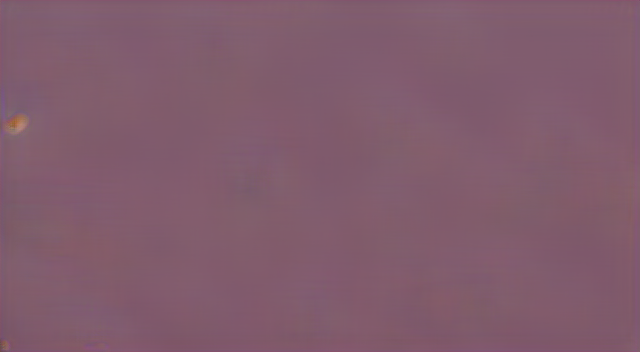

i: 50, loss: 0.815948, losses: 0.815948


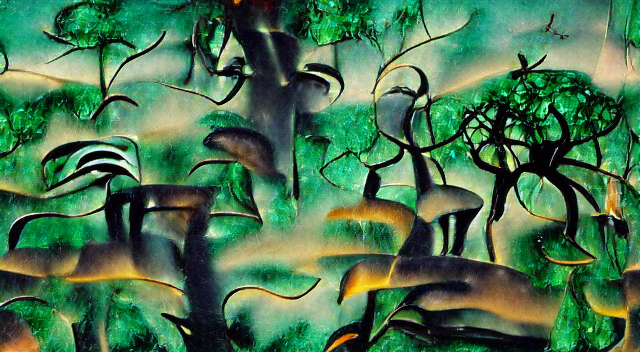

i: 100, loss: 0.799883, losses: 0.799883


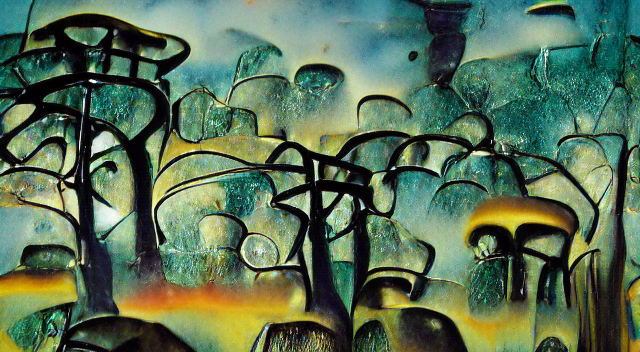

i: 120, loss: 0.808833, losses: 0.808833


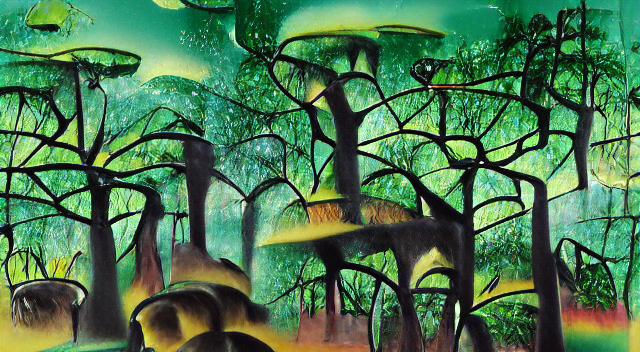

Updating to scene 2: {'texts': 'vaporwave forest by Salvador Dali:3 | artstationHQ', 'max_steps': 100, 'scale': 1.01, 'top_offset': -10}


  0%|          | 0/100 [00:00<?, ?it/s]

i: 0, loss: 3.30967, losses: 2.36126, 0.948408


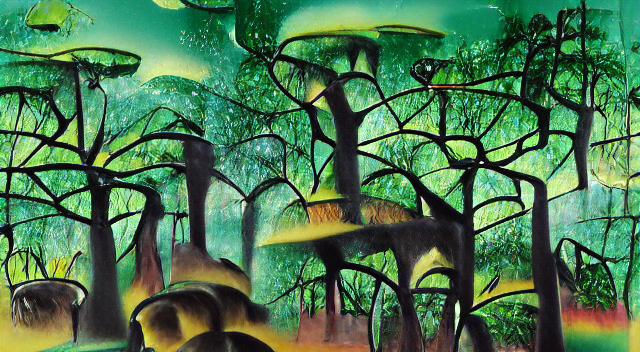

i: 50, loss: 3.14868, losses: 2.22405, 0.924633


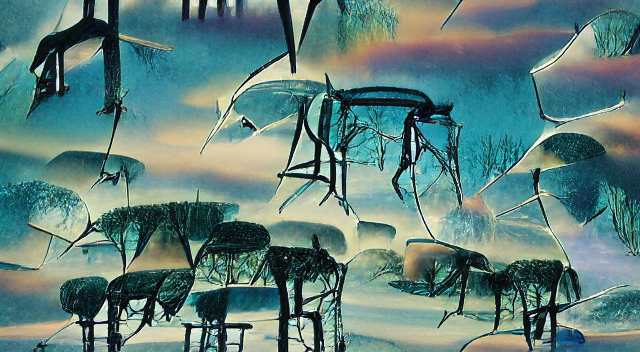

i: 100, loss: 3.17164, losses: 2.23157, 0.94007


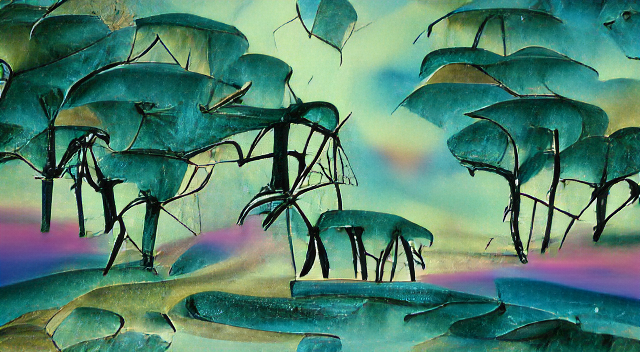

Updating to scene 3: {'texts': 'synthwave forest by Salvador Dali:3 | artstationHQ | green and white:-1', 'max_steps': 100, 'scale': 1.02}


  0%|          | 0/100 [00:00<?, ?it/s]

i: 0, loss: 2.33916, losses: 2.33144, 0.920036, -0.912316


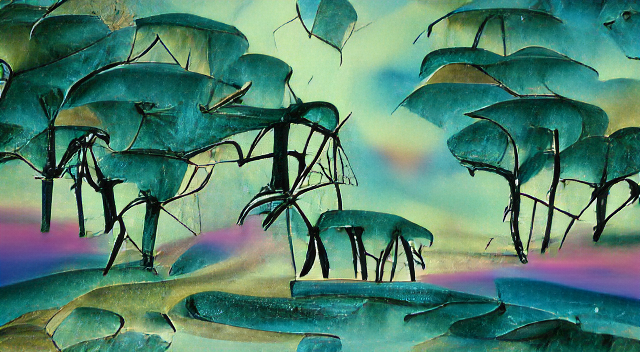

i: 50, loss: 2.44747, losses: 2.46108, 0.893503, -0.907109


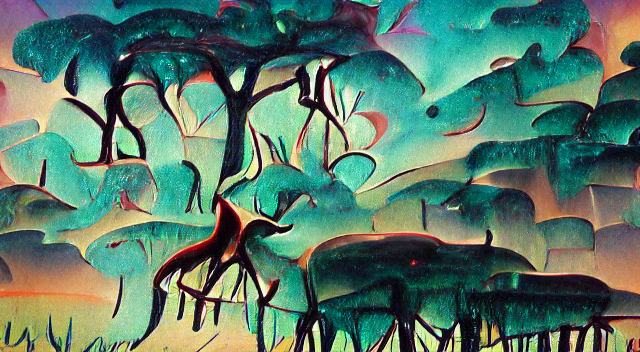

i: 100, loss: 2.43117, losses: 2.49172, 0.896909, -0.957461


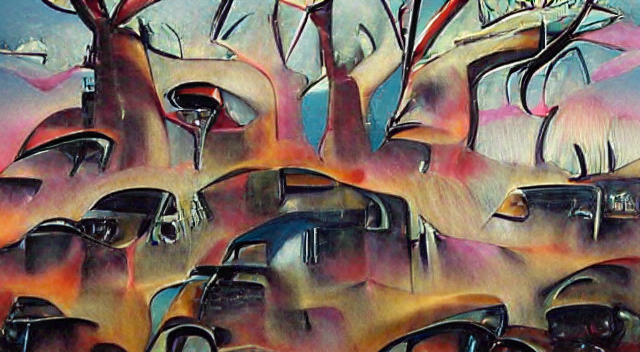

Updating to scene 4: {'texts': 'cyberpunk forest by Yoshitaka Amano', 'max_steps': 100, 'scale': 1.02}


  0%|          | 0/100 [00:00<?, ?it/s]

i: 0, loss: 0.862506, losses: 0.862506


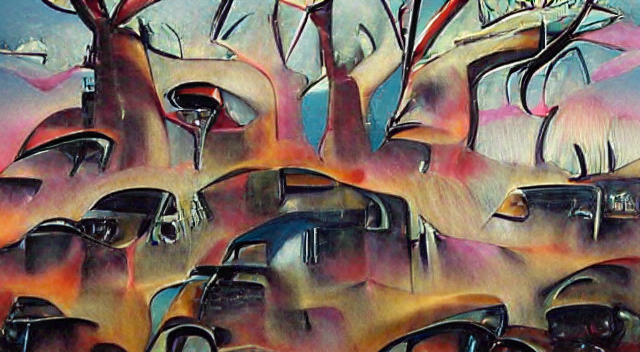

i: 50, loss: 0.782714, losses: 0.782714


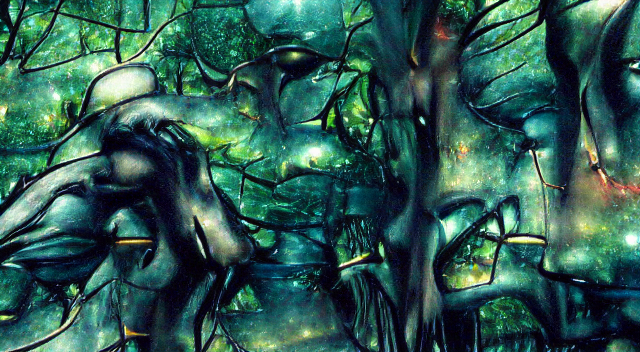

i: 100, loss: 0.800057, losses: 0.800057


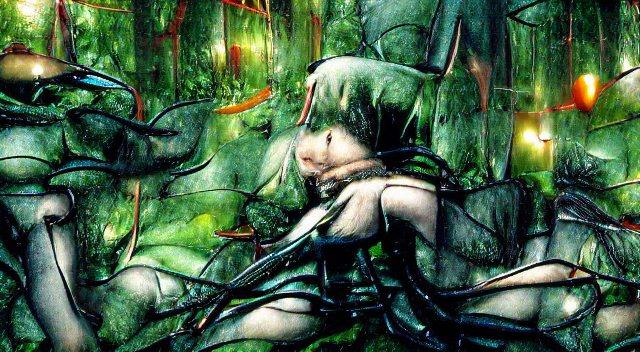

Updating to scene 5: {'texts': 'mixed media vaporwave forest by Yoshitaka Amano', 'max_steps': 100, 'scale': 1.02, 'angle': 1}


  0%|          | 0/100 [00:00<?, ?it/s]

i: 0, loss: 0.850919, losses: 0.850919


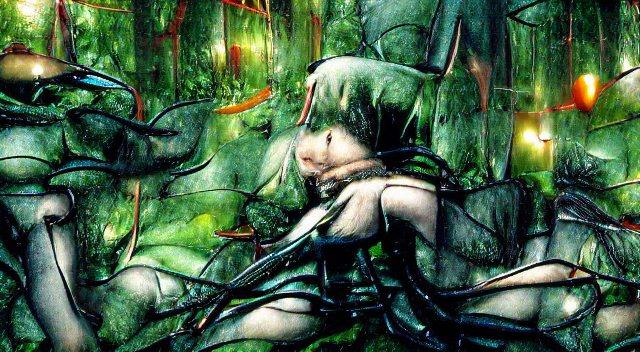

i: 50, loss: 0.768702, losses: 0.768702


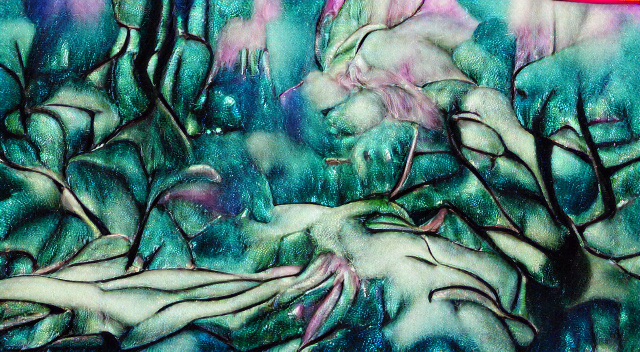

i: 100, loss: 0.850745, losses: 0.850745


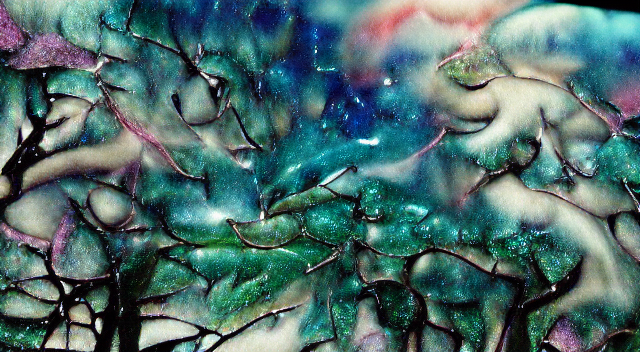

Updating to scene 6: {'texts': 'dye-transfer synthwave forest by Yoshitaka Amano', 'max_steps': 100, 'scale': 1.02, 'angle': -1}


  0%|          | 0/100 [00:00<?, ?it/s]

i: 0, loss: 0.802143, losses: 0.802143


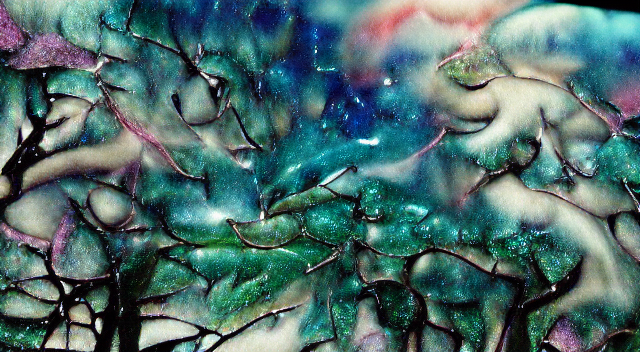

i: 50, loss: 0.792487, losses: 0.792487


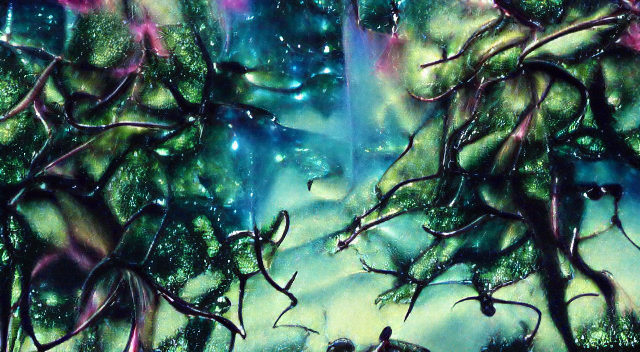

i: 100, loss: 0.822483, losses: 0.822483


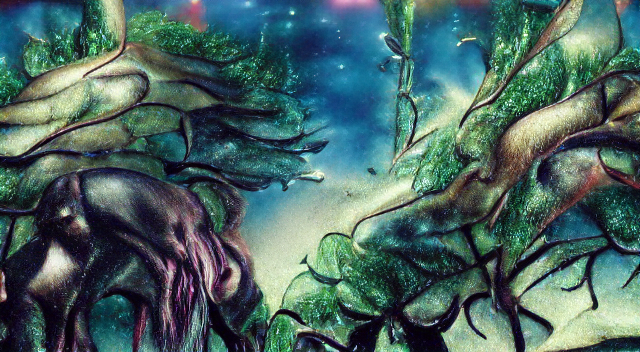

In [ ]:
#@title Start AI Video Generation!

!rm -rf steps
!mkdir steps

# Update w/ initial params from script
if "init_params" in script:
    init_params = script['init_params']
    width = init_params.get("width", gen_config.get('width'))
    height = init_params.get("height", gen_config.get('height'))
    learning_rate = init_params.get("learning_rate", gen_config.get('learning_rate'))
    frame_save_start = init_params.get("frame_save_start", gen_config.get('frame_save_start'))
    init_image = init_params.get("init_image", gen_config.get('init_image'))


model_names={"vqgan_imagenet_f16_16384": 'ImageNet 16384',"vqgan_imagenet_f16_1024":"ImageNet 1024", 'vqgan_openimages_f16_8192':'OpenImages 8912',
                "wikiart_1024":"WikiArt 1024", "wikiart_16384":"WikiArt 16384", "coco":"COCO-Stuff", "faceshq":"FacesHQ", "sflckr":"S-FLCKR"}
name_model = model_names[model_name]     

if seed == -1:
    seed = None
if init_image == "None":
    init_image = None
# if target_images == "None" or not target_images:
#     model_target_images = []
# else:
#     model_target_images = target_images.split("|")
#     model_target_images = [image.strip() for image in model_target_images]

model_texts = [phrase.strip() for phrase in texts.split("|")]
if model_texts == ['']:
    model_texts = []


args = argparse.Namespace(
    prompts=model_texts,
    # image_prompts=model_target_images,
    noise_prompt_seeds=[],
    noise_prompt_weights=[],
    size=[width, height],
    init_image=init_image,
    init_weight=0.,
    clip_model='ViT-B/32',
    vqgan_config=f'{model_name}.yaml',
    vqgan_checkpoint=f'{model_name}.ckpt',
    step_size=learning_rate,
    cutn=32,
    cut_pow=1.,
    display_freq=images_interval,
    seed=seed,
)
from urllib.request import urlopen

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
# if model_texts:
#     print('Using texts:', model_texts)
# if model_target_images:
#     print('Using image prompts:', model_target_images)
if args.seed is None:
    seed = torch.seed()
else:
    seed = args.seed
torch.manual_seed(seed)
# print('Using seed:', seed)

model = load_vqgan_model(args.vqgan_config, args.vqgan_checkpoint).to(device)
perceptor = clip.load(args.clip_model, jit=False)[0].eval().requires_grad_(False).to(device)
# clock=deepcopy(perceptor.visual.positional_embedding.data)
# perceptor.visual.positional_embedding.data = clock/clock.max()
# perceptor.visual.positional_embedding.data=clamp_with_grad(clock,0,1)

cut_size = perceptor.visual.input_resolution

f = 2**(model.decoder.num_resolutions - 1)
make_cutouts = MakeCutouts(cut_size, args.cutn, cut_pow=args.cut_pow)

toksX, toksY = args.size[0] // f, args.size[1] // f
sideX, sideY = toksX * f, toksY * f

if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
    e_dim = 256
    n_toks = model.quantize.n_embed
    z_min = model.quantize.embed.weight.min(dim=0).values[None, :, None, None]
    z_max = model.quantize.embed.weight.max(dim=0).values[None, :, None, None]
else:
    e_dim = model.quantize.e_dim
    n_toks = model.quantize.n_e
    z_min = model.quantize.embedding.weight.min(dim=0).values[None, :, None, None]
    z_max = model.quantize.embedding.weight.max(dim=0).values[None, :, None, None]
# z_min = model.quantize.embedding.weight.min(dim=0).values[None, :, None, None]
# z_max = model.quantize.embedding.weight.max(dim=0).values[None, :, None, None]

# normalize_imagenet = transforms.Normalize(mean=[0.485, 0.456, 0.406],
#                                            std=[0.229, 0.224, 0.225])

if args.init_image:
    if 'http' in args.init_image:
        img = Image.open(urlopen(args.init_image))
    else:
        img = Image.open(args.init_image)
    pil_image = img.convert('RGB')
    if pil_image.size != (width, height):
      print(f"Resizing source image to {width}x{height}")
      pil_image = pil_image.resize((sideX, sideY), Image.LANCZOS)
    pil_tensor = TF.to_tensor(pil_image)
    z, *_ = model.encode(pil_tensor.to(device).unsqueeze(0) * 2 - 1)
else:
    one_hot = F.one_hot(torch.randint(n_toks, [toksY * toksX], device=device), n_toks).float()
    # z = one_hot @ model.quantize.embedding.weight
    if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
        z = one_hot @ model.quantize.embed.weight
    else:
        z = one_hot @ model.quantize.embedding.weight
    z = z.view([-1, toksY, toksX, e_dim]).permute(0, 3, 1, 2) 
    z = torch.rand_like(z)*2
z_orig = z.clone()
z.requires_grad_(True)
opt = optim.Adam([z], lr=args.step_size)

normalize = transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                                std=[0.26862954, 0.26130258, 0.27577711])


pMs = []

for prompt in args.prompts:
    txt, weight, stop = parse_prompt(prompt)
    embed = perceptor.encode_text(clip.tokenize(txt).to(device)).float()
    pMs.append(Prompt(embed, weight, stop).to(device))

# for prompt in args.image_prompts:
#     path, weight, stop = parse_prompt(prompt)
#     img = Image.open(path)
#     pil_image = img.convert('RGB')
#     img = resize_image(pil_image, (sideX, sideY))
#     batch = make_cutouts(TF.to_tensor(img).unsqueeze(0).to(device))
#     embed = perceptor.encode_image(normalize(batch)).float()
#     pMs.append(Prompt(embed, weight, stop).to(device))

# for seed, weight in zip(args.noise_prompt_seeds, args.noise_prompt_weights):
#     gen = torch.Generator().manual_seed(seed)
#     embed = torch.empty([1, perceptor.visual.output_dim]).normal_(generator=gen)
#     pMs.append(Prompt(embed, weight).to(device))

def synth(z):
    if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
        z_q = vector_quantize(z.movedim(1, 3), model.quantize.embed.weight).movedim(3, 1)
    else:
        z_q = vector_quantize(z.movedim(1, 3), model.quantize.embedding.weight).movedim(3, 1)
    return clamp_with_grad(model.decode(z_q).add(1).div(2), 0, 1)

@torch.no_grad()
def checkin(i, losses):
    losses_str = ', '.join(f'{loss.item():g}' for loss in losses)
    tqdm.write(f'i: {i}, loss: {sum(losses).item():g}, losses: {losses_str}')
    out = synth(z)
    TF.to_pil_image(out[0].cpu()).save('progress.png')
    display.display(display.Image('progress.png'))

def ascend_txt():
    # global i
    out = synth(z)
    iii = perceptor.encode_image(normalize(make_cutouts(out))).float()
    
    result = []

    if args.init_weight:
        # result.append(F.mse_loss(z, z_orig) * args.init_weight / 2)
        result.append(F.mse_loss(z, torch.zeros_like(z_orig)) * ((1/torch.tensor(i*2 + 1))*args.init_weight) / 2)
    for prompt in pMs:
        result.append(prompt(iii))

    if step >= frame_save_start:
        img = TF.to_pil_image(out[0].cpu())
        if img.size != (width, height):
          img = img.resize((width, height), Image.LANCZOS)

        img.save(f"./steps/{step:04d}.png")
    return result

def train(i, ):
    opt.zero_grad()
    lossAll = ascend_txt()
    if i % args.display_freq == 0:
        checkin(i, lossAll)
    
    loss = sum(lossAll)
    loss.backward()
    opt.step()
    with torch.no_grad():
        z.copy_(z.maximum(z_min).minimum(z_max))

step = 0
try:
    scenes = script['scenes']
    for s_i, s in enumerate(scenes):
      # Update w/ scenes params from script
      tqdm.write(f"Updating to scene {s_i+1}: {s}")
      max_steps = s.get("max_steps", gen_config.get('max_steps'))
      scale = s.get("scale", gen_config.get('scale'))
      angle = s.get("angle", gen_config.get('angle'))
      left_offset = s.get("left_offset", gen_config.get('left_offset'))
      top_offset = s.get("top_offset", gen_config.get('top_offset'))

      if 'texts' in s:
        texts = s.get("texts", gen_config.get('texts'))
        model_texts = [phrase.strip() for phrase in texts.split("|")]
        if model_texts == ['']:
            model_texts = []

        pMs = []
        for prompt in model_texts:
            txt, weight, stop = parse_prompt(prompt)
            embed = perceptor.encode_text(clip.tokenize(txt).to(device)).float()
            pMs.append(Prompt(embed, weight, stop).to(device))


      for i in tqdm(range(max_steps)):
          train(i)

          # Reencode image
          out = synth(z)
          pil_image = TF.to_pil_image(out[0].cpu())
          if scale or angle:
              pil_image = TF.affine(pil_image, scale=scale, angle=angle, translate=(0.0, 0.0), shear=0)
          if left_offset or top_offset:
              pil_image = ImageChops.offset(pil_image, left_offset, top_offset)
          pil_tensor = TF.to_tensor(pil_image)

        
          z, *_ = model.encode(pil_tensor.to(device).unsqueeze(0) * 2 - 1)
          z_orig = z.clone()
          z.requires_grad_(True)
          opt = optim.Adam([z], lr=args.step_size)
          step += 1
      checkin(max_steps, ascend_txt())
except KeyboardInterrupt:
    pass



## Upscale Video (Optional)

These next couple cells will upscale all video frame up to 4X using [Real-ESRGAN](https://github.com/xinntao/Real-ESRGAN). It can be used to take a small 640x360px video all the way up to 1440p!

Note that this is time consuming: upscaling all the frames will take slightly longer than it did to generate the entire video in the first place.

In [ ]:
#@title Set up Real-ESRGAN
#@markdown Ignore the errors.

# Clone Real-ESRGAN and enter the Real-ESRGAN
!git clone https://github.com/xinntao/Real-ESRGAN.git
%cd Real-ESRGAN
# Set up the environment
!pip install basicsr
!pip install -r requirements.txt
!python setup.py develop
# Download the pre-trained model
!wget https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth -P experiments/pretrained_models

%cd ..

Cloning into 'Real-ESRGAN'...
remote: Enumerating objects: 266, done.
remote: Counting objects: 100% (266/266), done.
remote: Compressing objects: 100% (162/162), done.
remote: Total 266 (delta 130), reused 205 (delta 78), pack-reused 0
Receiving objects: 100% (266/266), 3.17 MiB | 20.58 MiB/s, done.
Resolving deltas: 100% (130/130), done.
/content/Real-ESRGAN
     |████████████████████████████████| 136 kB 5.2 MB/s 
     |████████████████████████████████| 5.7 MB 25.9 MB/s 
     |████████████████████████████████| 185 kB 92.4 MB/s 
  Created wheel for basicsr: filename=basicsr-1.3.3.11-py3-none-any.whl size=171449 sha256=93fa633658a69ca5efcdbea0cb0b8cf917e8c7603afc213a134205735c4b18bb
  Stored in directory: /root/.cache/pip/wheels/6f/04/aa/bc586aa633bd493c3535a6570fcd03782b7a696e2178167da7
Successfully built basicsr


     |████████████████████████████████| 1.1 MB 5.2 MB/s 
ERROR: Could not find a version that satisfies the requirement gfpgan>=0.2.1 (from versions: 0.2.1)
ERROR: No matching distribution found for gfpgan>=0.2.1
running develop
running egg_info
creating realesrgan.egg-info
writing realesrgan.egg-info/PKG-INFO
writing dependency_links to realesrgan.egg-info/dependency_links.txt
writing requirements to realesrgan.egg-info/requires.txt
writing top-level names to realesrgan.egg-info/top_level.txt
writing manifest file 'realesrgan.egg-info/SOURCES.txt'
reading manifest template 'MANIFEST.in'
adding license file 'LICENSE'
writing manifest file 'realesrgan.egg-info/SOURCES.txt'
running build_ext
Creating /usr/local/lib/python3.7/dist-packages/realesrgan.egg-link (link to .)
Adding realesrgan 0.2.2.0 to easy-install.pth file

Installed /content/Real-ESRGAN
Processing dependencies for realesrgan==0.2.2.0
Searching for gfpgan>=0.2.1
Reading https://pypi.org/simple/gfpgan/
Best match: gfpgan 0.2

In [ ]:
#@title Render upscaled frames

!rm -rf upscaled

render_scale = "1080p (3x scaling)" #@param ["720p (2x scaling)", "1080p (3x scaling)", "1440p (4x scaling)"]

if render_scale == "720p (2x scaling)":
  scale = 2
elif render_scale == "1080p (3x scaling)":
  scale = 3
elif render_scale == "1440p (4x scaling)":
  scale = 4
else:
  scale = 1

print("Rendering Upscaled Images...")
result = os.system(f"cd Real-ESRGAN && python inference_realesrgan.py --model_path experiments/pretrained_models/RealESRGAN_x4plus.pth --input ../steps --output ../upscaled --netscale 4 --outscale {scale} --half")
print("Upscaled images saved in /upscaled!")

Rendering Upscaled Images...
Upscaled images saved in /upscaled!


## Generate Video

This cell generates the final video! It will be saved as `vqgan_clip.mp4` which can do be download from the sidebar on the left (if it was note upscaled: see later for how to better handle upscaled videos)

- **`frame_rate`**: Frame rate of the video. 24fps is recommended for a cinematic appeal, and **higher frame rates increase the risk of photosensitivity**.
- **`use_upscaled_frames`**: Use the upscaled frames you generated in the previous cell instead.
- **`watermark_path`**: If you want to add a watermark to deter uncredited usage of the video, you can upload it to the sidebar and put the filename here. The watermark will be placed in the bottom-center of the video, and it's recommended you use a watermark with a transparent background.
- **`watermark_opacity`**: Opacity of the watermark, if used.

In [ ]:
frame_rate = 24 #@param {type:"number"}
use_upscaled_frames = False #@param {type:"boolean"}
watermark_path = "" #@param {type:"string"}
watermark_opacity = 0.4 #@param {type:"slider", min:0, max:1, step:0.1}

if use_upscaled_frames:
  print("Rendering Video using Upscaled Frames...")
  if watermark_path:
    assert os.path.isfile(watermark_path), "Watermark file not uploaded to Colab."
    result = os.system(f'ffmpeg -y -r {frame_rate} -start_number {frame_save_start} -i /content/upscaled/%04d_out.png -i "{watermark_path}" -filter_complex "[1]format=rgba,colorchannelmixer=aa={watermark_opacity}[logo];[0][logo]overlay=(W-w)/2:H-h-5:format=auto,format=yuv420p" -c:v libx264 /content/vqgan_clip.mp4')
  else:
    result = os.system(f"ffmpeg -y -r {frame_rate} -start_number {frame_save_start} -i /content/upscaled/%04d_out.png -c:v libx264 -vf fps={frame_rate} -pix_fmt yuv420p /content/vqgan_clip.mp4")
  print("Video saved at vqgan_clip.mp4! (You may want to copy the video to Google Drive before downloading!)")
else:
  print("Rendering Video...")
  if watermark_path:
    assert os.path.isfile(watermark_path), "Watermark file not uploaded to Colab."
    # print(f'ffmpeg -y -r {frame_rate} -start_number {frame_save_start} -i /content/steps/%04d.png  -i "{watermark_path}" -filter_complex "[1]format=rgba,colorchannelmixer=aa={watermark_opacity}[logo];[0][logo]overlay=(W-w)/2:H-h-5:format=auto,format=yuv420p" -c:v libx264 /content/vqgan_clip.mp4')
    result = os.system(f'ffmpeg -y -r {frame_rate} -start_number {frame_save_start} -i /content/steps/%04d.png  -i "{watermark_path}" -filter_complex "[1]format=rgba,colorchannelmixer=aa={watermark_opacity}[logo];[0][logo]overlay=(W-w)/2:H-h-5:format=auto,format=yuv420p" -c:v libx264 /content/vqgan_clip.mp4')
  else:
    result = os.system(f"ffmpeg -y -r {frame_rate} -start_number {frame_save_start} -i /content/steps/%04d.png -c:v libx264 -vf fps={frame_rate} -pix_fmt yuv420p /content/vqgan_clip.mp4")
  print("Video saved at vqgan_clip.mp4!")

# from google.colab import files
# files.download('/content/vqgan_clip.mp4')

Rendering Video...
Video saved at vqgan_clip.mp4!


# Save Video to Colab

You may want to copy the generated video to Google Drive first before downloading it from there, especially if it's an upscaled video. (Colab tends to choke at downloading files larger than 25MB, whereas Drive does not.)

In [ ]:
#@title Authorize Google Drive

from google.colab import drive
drive.mount("/content/drive")

In [ ]:
#@title Copy Generated Video to Your Google Drive
import shutil
target_file_name = "vqgan_clip.mp4" #@param {type: "string"}

file_path = "/content/vqgan_clip.mp4"
dest_path = os.path.join("/content/drive/My Drive/", target_file_name)
shutil.copyfile(file_path, dest_path)

'/content/drive/My Drive/vqgan_clip.mp4'

## Notes / Helpful Tips

- The recommended `learning_rate` is around 0.4-0.5, and lower normal rates like 0.1-0.2 will causes the model to diverge. Yes, this violates most assumptions about machine learning, but that's why you gotta experiment!
- The first scene should have a `max_steps` plus whatever you do for `frame_save_state` so that the final video has the intended length of the scene (this is not automatically enforced since this may not be wanted behavior).
- Zooming out (`scale` < 1) isn't currently recommended since the AI doesn't like the pure black that results (wonder if adding noise to that will help)
- If uploading to social media, you may want add an audio track (that is copyright-free!). On your own computer, you can do this [with FFMPEG](https://stackoverflow.com/a/11783474) without reencoding the video, e.g:

```sh
ffmpeg -i vqgan_clip.mp4 -i audio.mp3 -map 0 -map 1:a -c:v copy -shortest vqgan_clip_audio.mp4
```

## License

MIT License

Copyright (c) 2021 Max Woolf

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.

---

Copyright (c) 2021 Katherine Crowson

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.